# **Deep Learning - Visual Grounding**

## Students

- Zhengji Li  
- Mauricio Eduardo Negrete Rodriguez

# Introduction
Visual grounding is the process of relating a sentence and an image, it tries to identify visual objects within an image that correspond to a given language query.

The task at hand is to perform visual grounding by fine-tuning and building a Deep Learning framework.

We will be using **CLIP** [[1]](https://github.com/openai/CLIP)  (Contrastive Language-Image Pre-Training), "*a neural network trained on a variety of (image, text) pairs. It can be instructed in natural language to predict the most relevant text snippet, given an image, without directly optimizing for the task, similarly to the zero-shot capabilities of GPT-2 and 3*" and **YOLOv5** [[2]](https://github.com/ultralytics/yolov5) "*an object detection model that belongs to the YOLO (You Only Look Once) family of models. It is a state-of-the-art deep learning model for real-time object detection tasks. YOLO models are known for their efficiency and accuracy in detecting objects in images and videos*".

For the dataset, we will be using the **RefCOCOg** [[3]](https://arxiv.org/pdf/1608.00272.pdf) dataset, "*COCO is a large-scale object detection, segmentation, and captioning dataset*" [[4]](https://cocodataset.org/#home) and in the case of the **RefCOCOg** it "*provides more complex expressions, often entire sentences rather than phrases.*"

The structure of this assignment can be found in this file as:

1. [**Understanding the Dataset**](#scrollTo=yDlV3Bw-RNJ4&line)
2. [**Fine-tuning/Build the framework**](#scrollTo=ac2LN4_8gdbv&line)
3. [**Analysis of the results**](#scrollTo=KL4KXVlXgL-E&line)
4. [**Conlusion and future work**](#scrollTo=g_ofNgQ8Dv_5&line)

# Understanding the Dataset

**RefCOCOg** consists of 85,474 referring expressions for 54,822
objects in 26,711 images. Images were selected to contain between 2 and 4 objects of the same object category. One set of workers were asked to write natural language referring expressions for objects in MSCOCO images then another set of workers were asked to click on the indicated object given a referring expression. [[5]](https://www.tensorflow.org/datasets/catalog/ref_coco)

The dataset contains two important files that we will be using, the **refs(umd).p** and **instances.json**

### refs(umd).p

This file is in the pickle format (used for serializing and deserializing in python) and we can extract the infromation using the pickle module. The specified file contains the annotations made for each image, several objects can be found in the same image or have different category of objects, in other words, an image can have several annotated objects. An example of the structure in this file is:

**Example of Data**

```python
{
    'image_id': 380440,
    'split': 'test',
    'sentences': [{
        'tokens': ['the', 'man', 'in', 'yellow', 'coat'],
        'raw': 'the man in yellow coat',
        'sent_id': 8,
        'sent': 'the man in yellow coat'
    }, {
        'tokens': ['skiier', 'in', 'red', 'pants'],
        'raw': 'Skiier in red pants.',
        'sent_id': 9,
        'sent': 'skiier in red pants'
    }],
    'file_name': 'COCO_train2014_000000380440_491042.jpg',
    'category_id': 1,
    'ann_id': 491042,
    'sent_ids': [8, 9],
    'ref_id': 0
}
```

Some important fields:


*   *image_id* - The image id, this is found in the file name and also it's useful for reference in the instances.json

*   *split* - it's the split type (test,train or val)

*   *sentences* - It’s an array of all the sentences of the relevant objects found on the image, the raw is the sentence without processing, while the "sent" is the processed version

*   *file_name* - the name of the file name, the format differs from instances.json file and the refs(umd).p file

*   *category_id* - Its the category id

*   *ann_id* - The annotation id, this is the unique identifier for each individual object instance annotation in the dataset. The ann_id refers to the instance.json, in other words, the id in the instance.json is the ann_id in the refs(umd).p file


***NOTE***: The *file_name* field on this file adds the annotation id to the end of the name therefore the format is found as ***COCO_(split)(year)_(id)_(ann_id).jpg*** which is different in comparasion to the instance.json which only has the format as ***COCO_(split)(year)_(id).jpg***

### instances.json

This file is in the json format and we can extract the infromation using the json module. The file being referred to contains the categories, images, among other information.


**Example of Annotation**

```python
"annotations": [
        {
            "segmentation": [
                [
                    283.47,
                    194.46,
                    271.43,
                    192.79,
                    274.44,
                    189.61,
                    285.65,
                    191.61
                ]
            ],
            "area": 39.811199999999815,
            "iscrowd": 0,
            "image_id": 131074,
            "bbox": [
                271.43,
                189.61,
                14.22,
                4.85
            ],
            "category_id": 75,
            "id": 1630619
        }
    ]
```

The fields are mostly self explanatory here, "is_crowd" is not used for this task but it represents if there is more than one instance of an object for that annotation in the image. "bbox" is the bounding box information.


**Example of Category**
```python
    "categories": [
        {
            "supercategory": "person",
            "id": 1,
            "name": "person"
        },
        {
            "supercategory": "indoor",
            "id": 90,
            "name": "toothbrush"
        }
    ]
```

Also the fields are self explanatory, supercategory is a more abstract representation of the object but we won't use this field.

**NOTE:** While the max id for categories is 90, the **RefCOCOg** only contains annotations for 80 categories, in other words, it's missing some of the classes as it doesn't include them even in the instances.json

# Fine-tuning

Most of the work is found here as we will talk about the dataset prepping state, loading the modules to the solution we've implemented.

### Prepping the Dataset

In [ ]:
# We define a global path to where to find our files
PATH = '/content'
DATASET_PATH = PATH + '/refcocog'
IMAGES_PATH = DATASET_PATH + '/images'

#### Download Dataset

Uncomment if needed to download the dataset file

In [ ]:
# We need gdown to download the dataset
!pip install gdown

In [ ]:
# Download the Dataset file
!gdown 1xijq32XfEm6FPhUb7RsZYWHc2UuwVkiq

Downloading...
From: https://drive.google.com/uc?id=1xijq32XfEm6FPhUb7RsZYWHc2UuwVkiq
To: /content/refcocog.tar.gz
100% 13.5G/13.5G [01:48<00:00, 124MB/s] 


#### Mounting drive for Dataset

Mount the working directory in drive that we will be using

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Create a folder for the Dataset contents

In [ ]:
!pwd
!mkdir Dataset

/content


#### Extacting the Dataset

In case the need to delete the dataset from drive, run the following:

In [ ]:
# Command to delete all the images in the drive
# !rm -rf /content/refcocog/*

Command to extact the dataset to the drive, uncomment if needed

In [ ]:
!tar -xvf /content/refcocog.tar.gz -C /content/

### Load the Dataset and CLIP

#### Load CLIP and Yolo

In [ ]:
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git

In [ ]:
! git clone https://github.com/ultralytics/yolov5  # clone
! pip install ultralytics

Now we import all the packages and methods that we will be using through out this assignment.

In [ ]:
import json
import pickle
import os
import torch
import clip
import matplotlib.pyplot as plt
import numpy as np
import shutil

from tqdm import tqdm
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import StepLR
from torch.nn.utils import clip_grad_norm_
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from pathlib import Path
from sklearn.metrics.pairwise import cosine_similarity
from torchvision.ops import box_iou

#### Load Dataset

In [ ]:
# The JSON file to read with the images data
JSON_FILE_LOCATION = f'{DATASET_PATH}/annotations/instances.json'

# The pickle file to read with all the annotations data
REFS_FILE_LOCATION = f'{DATASET_PATH}/annotations/refs(umd).p'

# Load instances
with open(JSON_FILE_LOCATION, 'r') as json_file:
    instance_data = json.load(json_file)

# Load annotations
with open(REFS_FILE_LOCATION, 'rb') as pickle_file:
    annotations = pickle.load(pickle_file)

print(instance_data.keys())
print(len(annotations))

dict_keys(['info', 'images', 'licenses', 'annotations', 'categories'])
49822


### Training CLIP

To train CLIP with our Dataset, the following points were taken into account when deciding how to train it:

*   Dataset is huge which would imply high times for training if we took the whole dataset
*   Images can have several categories of objects
*   Images can have several annotations

We have put the following restrictions to reduce the complexity:

*   Only take one image per annotation, this means an image will define just one category
*   Take the first sentence found in the annotation for the image
*   We use the same split defined by the RefCOCOg dataset [[5]](https://www.tensorflow.org/datasets/catalog/ref_coco)

We load our dataset into a respective python structure

In [ ]:
# Get all file names in the directory (without full path)
file_set = set(os.listdir(f'{IMAGES_PATH}'))

In [ ]:
# Temporary dictionaries to retrieve necessary data from the instance
instance_data_dictionary = { obj['id']: obj for obj in instance_data['annotations']}
classes_dictionary = {obj['id']: obj for obj in instance_data['categories']}

In [ ]:
def load_data(ignore_repeated_images):
  """
  Method to load the data and counter dictionary, we can ignore or not the
  repeated images

  Args:
    :param ignore_repeated_images: boolean to ignore or not repeated images
    :return: a dictionary with the data and counters
  """
  # This set is used to keep up with the images it
  # has already encountered and avoid repeated ones
  encountered_images = set()

  # Initialize default storage
  default_data = {
    'train': {},
    'test': {},
    'val': {}
  }

  default_counters = {
    'train': 0,
    'test': 0,
    'val': 0
  }

  for ann_data in tqdm(annotations):
      # Removing annotation id from filename
      image_name = ann_data['file_name'].rsplit('_', 1)[0] + '.jpg'

      # We check if the image exists in our directory with the dataset
      if image_name not in file_set:
          continue

      # Avoid repeated images
      if ignore_repeated_images:
        if image_name in encountered_images:
          continue
        encountered_images.add(image_name)

      temp_dict = {
          'sentences': [sentence['sent'] for sentence in ann_data['sentences']],
          'category_id': ann_data['category_id'],
          'file_name': image_name,
          'class': classes_dictionary[ann_data['category_id']]['name'],
          'bbox': instance_data_dictionary[ann_data['ann_id']]['bbox']
      }
      split = ann_data['split']
      default_data[split][default_counters[split]] = temp_dict
      default_counters[split] += 1

  return default_data, default_counters

In [ ]:
# We load up the data ignoring the repeated images
data, counters = load_data(True)

100%|██████████| 49822/49822 [00:00<00:00, 274758.06it/s]


In [ ]:
print(len(data['train']))
print(len(data['val']))
print(len(data['test']))

21899
1300
2600


#### Train

In [ ]:
# load pretrained CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("RN50", device=device)
# Convert the model to fp32
model = model.float()

100%|███████████████████████████████████████| 244M/244M [00:03<00:00, 79.4MiB/s]


In [ ]:
# Define the Dataset structure
class RefCOCOGDataset(Dataset):
    def __init__(self, root_dir, data, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir, self.data[idx]['file_name'])
        image = Image.open(img_name).convert("RGB")

        if self.transform:
            image = self.transform(image)

        text = self.data[idx]['sentences'][0]

        return image, text

In [ ]:
# Load up the train data set and the validation set
train_dataset = RefCOCOGDataset(IMAGES_PATH,
                          data['train'],
                          transform=preprocess)
val_dataset = RefCOCOGDataset(IMAGES_PATH,
                          data['val'],
                          transform=preprocess)

In [ ]:
# Define contrastive loss function
temperature = 0.7
#0.1 0.5 1.0 more average but less confident
#0.7 in paper

# Apply weight decay to all parameters that are not bias
param_optimizer = list(model.named_parameters())
no_decay = ['bias', 'LayerNorm.bias', 'LayerNorm.weight']
optimizer_parameters = [
    {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)], 'weight_decay': 0.01},
    {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)], 'weight_decay': 0.0}
]

# Use Adam optimizer with decoupled weight decay
optimizer = torch.optim.AdamW(optimizer_parameters, lr=0.000001)


In [ ]:
num_epochs = 5000
# Apply cosine learning rate schedule
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=16)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=16)

writer = SummaryWriter(f'{PATH}/weights')

best_loss = float('inf')
patience = 10  # Number of epochs to wait for improvement
early_stop_counter = 0  # Counter for early stopping
best_model_path = None

# Run validation with pre-trained model and output the initial validation loss
model.eval()  # Set model to evaluation mode
initial_val_loss = 0.0
with torch.no_grad():
    for images, texts in val_loader:
        images = images.to(device)
        tokenized_texts = clip.tokenize(texts).to(device)
        text_features = model.encode_text(tokenized_texts)
        image_features = model.encode_image(images)

        logits_per_image = (image_features @ text_features.t()) / temperature
        labels = torch.arange(logits_per_image.size(0)).to(device)

        loss = torch.nn.functional.cross_entropy(logits_per_image, labels)
        initial_val_loss += loss.item()

initial_val_loss /= len(val_loader)
print(f"Initial validation loss: {initial_val_loss}")

for epoch in range(num_epochs):
    # Training phase
    model.train()  # Set model to training mode
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

    for images, texts in progress_bar:
        images = images.to(device)
        tokenized_texts = clip.tokenize(texts).to(device)
        text_features = model.encode_text(tokenized_texts)
        image_features = model.encode_image(images)

        logits_per_image = (image_features @ text_features.t()) / temperature
        labels = torch.arange(logits_per_image.size(0)).to(device)

        loss = torch.nn.functional.cross_entropy(logits_per_image, labels)

        optimizer.zero_grad()
        loss.backward()
        clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item()
        progress_bar.set_postfix({"Train Loss": loss.item()})

    epoch_loss = running_loss / len(train_loader)
    writer.add_scalar('Loss/Train', epoch_loss, epoch)

    # Validation phase
    model.eval()  # Set model to evaluation mode
    val_loss = 0.0
    with torch.no_grad():
        for images, texts in val_loader:
            images = images.to(device)
            tokenized_texts = clip.tokenize(texts).to(device)
            text_features = model.encode_text(tokenized_texts)
            image_features = model.encode_image(images)

            logits_per_image = (image_features @ text_features.t()) / temperature
            labels = torch.arange(logits_per_image.size(0)).to(device)

            loss = torch.nn.functional.cross_entropy(logits_per_image, labels)
            val_loss += loss.item()

    val_loss /= len(val_loader)
    writer.add_scalar('Loss/Validation', val_loss, epoch)
    progress_bar.set_postfix({"Train Loss": epoch_loss, "Validation Loss": val_loss})

    # Save model if validation loss improved
    if val_loss < best_loss:
        best_loss = val_loss
        early_stop_counter = 0
        best_model_path = f'{PATH}/weights/best_model.pth'
        torch.save(model.state_dict(), best_model_path)
    else:
        early_stop_counter += 1

    # Save the model every 100 epochs
    if epoch % 100 == 0:
        torch.save(model.state_dict(), f'{PATH}/weights/new_hyper_model_epoch_{epoch}.pth')

    print(f"Epoch {epoch+1}/{num_epochs}: Train Loss = {epoch_loss}, Validation Loss = {val_loss}")

    scheduler.step()

    # Early stopping
    if early_stop_counter >= patience:
        print(f"Early stopping at epoch {epoch+1}. Best model saved to {best_model_path}")
        break

writer.close()

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initial validation loss: 2.6420794508673926


Epoch 1/5000: Train Loss = 2.0589078938545184, Validation Loss = 1.6394417773593555


Epoch 2/5000: Train Loss = 1.5530362267826878, Validation Loss = 1.481449381871657


Epoch 3/5000: Train Loss = 1.3614202768996704, Validation Loss = 1.4053807746280322


Epoch 4/5000: Train Loss = 1.226248653562263, Validation Loss = 1.3676216060465032


Epoch 5/5000: Train Loss = 1.11444678660049, Validation Loss = 1.343596642667597


Epoch 6/5000: Train Loss = 1.0110246177849382, Validation Loss = 1.3223180933432146


Epoch 7/5000: Train Loss = 0.9331013461531594, Validation Loss = 1.3303431001576511


Epoch 8/5000: Train Loss = 0.8462593403190027, Validation Loss = 1.3318867900154807


Epoch 9/5000: Train Loss = 0.7692050051680485, Validation Loss = 1.3444761281663722


Epoch 10/5000: Train Loss = 0.6933783130330402, Validation Loss = 1.371435658498244


Epoch 11/5000: Train Loss = 0.6248584372359652, Validation Loss = 1.3948615789413452


Epoch 12/5000: Train Loss = 0.565944405662459, Validation Loss = 1.4102500514550642


Epoch 13/5000: Train Loss = 0.4986358841929888, Validation Loss = 1.4569443383000114


Epoch 14/5000: Train Loss = 0.45331299437080014, Validation Loss = 1.5002952082590624


Epoch 15/5000: Train Loss = 0.4057116452171359, Validation Loss = 1.5565443553707816


Epoch 16/5000: Train Loss = 0.35600060188796284, Validation Loss = 1.6092080311341719
Early stopping at epoch 16. Best model saved to /content/drive/MyDrive/DeepLearning/weights/best_model.pth


In [ ]:
# Delete model
torch.cuda.empty_cache()

#### Customized Dataset

For a quick test on our results we create a small custom dataset to evaluate the training of CLIP with our Dataset, to test it, this is wholly based on the code provided on the ***Lab 4 - Language and Vision***

**NOTE**: Because this is a small demostration based on the class code, the customised data is not included but the results obtained are shown in the output of the cells.

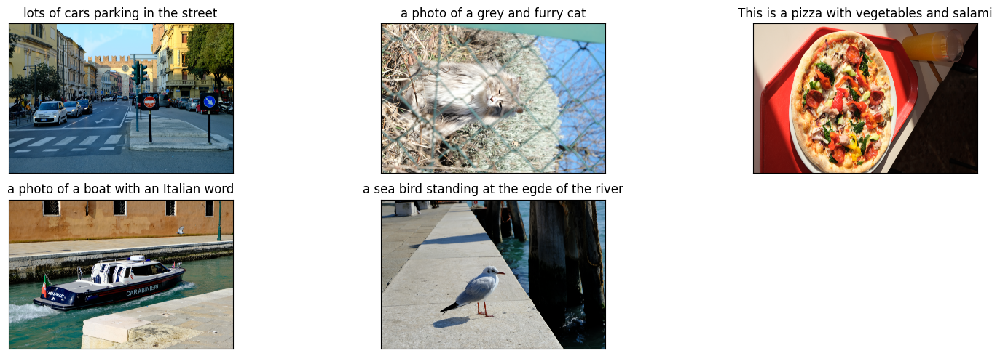

In [ ]:
DESCRIPTIONS = {
    "cat": "a photo of a grey and furry cat",
    "pizza": "This is a pizza with vegetables and salami",
    "boat": "a photo of a boat with an Italian word",
    "car": "lots of cars parking in the street",
    "bird": "a sea bird standing at the egde of the river",
}

def get_data():
    images = []
    texts = []

    # get all the filenams in the data directory
    data_dir = Path(f"{PATH}/customised_data")
    filenames = [
        filename for filename in data_dir.glob('*')
        if filename.suffix in {'.png', '.jpg'}
    ]

    for filename in filenames:
        # skip images we do not care about
        name = filename.stem
        if name not in DESCRIPTIONS:
            continue

        # store data
        images.append(filename)
        texts.append(DESCRIPTIONS[name])

    return images, texts

def visualise_data(images_fp: list[str], texts: list[str]):
    # create a matplotlib figure object
    plt.figure(figsize=(16, 5))

    for i, (image_fp, text) in enumerate(zip(images_fp, texts)):
        # open the images
        image = Image.open(image_fp).convert("RGB")

        # visualise the image
        plt.subplot(2, 3, i+1)
        plt.imshow(image)
        plt.title(text)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()

images_fp, texts = get_data()
visualise_data(images_fp, texts)

In [ ]:
# Load the pretrained CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"

# RN50 model to test
model_rn50, preprocess_rn50 = clip.load("RN50", device=device)

# Model with our trained weights
custom_model, custom_preprocess = clip.load("RN50", device=device)

model_path = f'{PATH}/weights/best_model.pth'
custom_model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [ ]:
# Function to encode images and text
def encode_data(images_fp: list[str], texts: list[str]):
  # preprocess the images to transform from filenames to images to tensors
  images = [preprocess(Image.open(image)) for image in images_fp]

  # preprocess the texts to transform from text to tensors
  images = torch.tensor(np.stack(images)).cuda()
  text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

  # encode the inputs
  with torch.no_grad():
    images_z = model.encode_image(images).float()
    texts_z = model.encode_text(text_tokens).float()

  return images_z, texts_z

In [ ]:
def cosine_similarity(images_z: torch.Tensor, texts_z: torch.Tensor):
  # normalise the image and the text
  images_z /= images_z.norm(dim=-1, keepdim=True)
  texts_z /= texts_z.norm(dim=-1, keepdim=True)

  # evaluate the cosine similarity between the sets of features
  similarity = (texts_z @ images_z.T)

  return similarity.cpu()

In [ ]:
def visualise_similarity(similarity: torch.Tensor, images_fp: list[str], texts: list[str]):
  similarity = similarity.numpy()
  count = len(texts)

  # create a matplotlib figure object
  plt.figure(figsize=(18, 12))

  # show similarity scores
  plt.imshow(similarity, vmin=0.1, vmax=0.3)

  # update plot ticks
  plt.yticks(range(count), texts, fontsize=18)
  plt.xticks([])

  # visualise each image
  for i, image_fp in enumerate(images_fp):
    image = Image.open(image_fp).convert("RGB")
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")

  # print the scores
  for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
      plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

  # update spines
  for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

  # change plot limits
  plt.xlim([-0.5, count - 0.5])
  plt.ylim([count + 0.5, -2])

  # set title
  plt.title("Cosine similarity between text and image features", size=20)

Similarity with our trained CLIP

In [ ]:
# Assign our custom model
model = custom_model
preprocess = custom_preprocess

# Calculate similarity
images_z, texts_z = encode_data(images_fp, texts)
similarity = cosine_similarity(images_z, texts_z)
print(similarity)

tensor([[ 0.3170,  0.0228, -0.0339,  0.0408,  0.0909],
        [-0.0358,  0.2538,  0.0284, -0.0391,  0.0775],
        [-0.0685, -0.0127,  0.2741, -0.1194, -0.0605],
        [ 0.0767,  0.0303, -0.0096,  0.2601,  0.1622],
        [ 0.0023,  0.1043, -0.0538,  0.0989,  0.2271]])


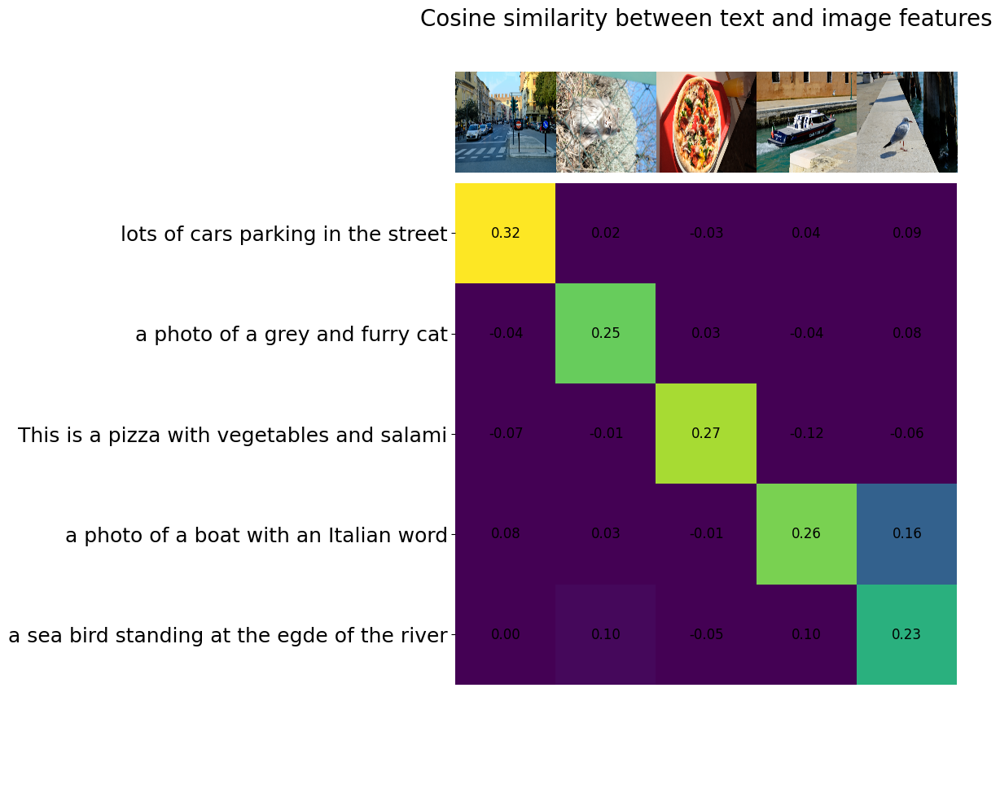

In [ ]:
visualise_similarity(similarity, images_fp, texts)

Similarity with RN50

In [ ]:
# Assign the RN50 model
model = model_rn50
preprocess = preprocess_rn50

# Calculate similarity
images_z_rn50, texts_z_rn50 = encode_data(images_fp, texts)
similarity_rn50 = cosine_similarity(images_z_rn50, texts_z_rn50)
print(similarity_rn50)

tensor([[0.1999, 0.1029, 0.0769, 0.1194, 0.1068],
        [0.1126, 0.2026, 0.1190, 0.0816, 0.1520],
        [0.0768, 0.0943, 0.2281, 0.0334, 0.0783],
        [0.1655, 0.1247, 0.1394, 0.2626, 0.1855],
        [0.1412, 0.1565, 0.0921, 0.1609, 0.2281]])


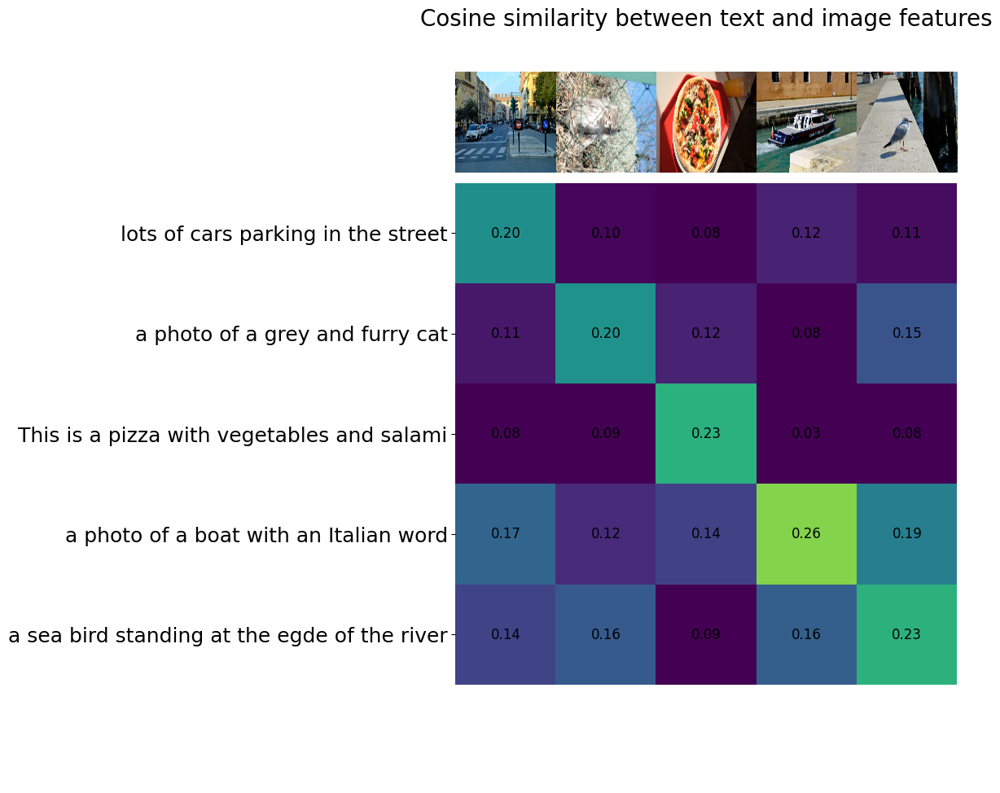

In [ ]:
visualise_similarity(similarity_rn50, images_fp, texts)

From these results we can see that, for this tasks, the results improved in the similarity matrix diagonal with only the customized data even thought in training we reduced the training dataset and the selected hyper-parameters some based on [[1]](https://github.com/openai/CLIP). Even so, there's a chance for improvement to obtain better results in CLIP by just fine-tuning the hyper-parameters.

This last point is discussed on [[6]](https://arxiv.org/abs/2212.06138), where they bring the issue that with current fine-tuning approaches the performance in CLIP tends to have only significant improvements, their results show that fine-tunning CLIP can be mostly done by only by fine-tunning the hyper-parameters and still obtain state-of-the-art results.




## Yolov5


The YoloV5 is trained in the COCO dataset but we found out that the numbering of the classes differs from [yolov5](https://github.com/ultralytics/yolov5/blob/master/data/coco.yaml) to RefCOCOg (e.g. *in the class "bus" id in RefCOCOg is 6 meanwhile in the COCO dataset "bus" id is 5*). Also, there are some missing classes in the RefCOCOg compared to the YoloV5, so we proceed to train the YoloV5 on the RefCOCOg dataset.

We've trained YoloV5 in a separate jupyter notebook file but we will go into detail here of the process.

We create some additional directories

**NOTE**: The PATHs here are kept differently as we need to create new folders on the root file so be careful as paths will differ from what we've defined on top

In [ ]:
!pwd
!mkdir fake_home
!mkdir fake_home/disi/
!mkdir fake_home/disi/yolo
!ls

In [ ]:
def create_folders():
    """
    Create the train and test folders for the images and labels
    """

    path_directory = 'fake_home/disi/yolo'

    data_set = ['train', 'test', 'val']
    folders = ['images', 'labels']

    for data_set_type in data_set:
        for folder in folders:
            path = path_directory + f'/{data_set_type}/{folder}/'
            if not os.path.exists(path):
                os.makedirs(path)

In [ ]:
create_folders()

To train YoloV5  we need to change our dataset to a specific file organization  and create text files that need certain format to describe the objects in the images.

For the files data format, we load (if not loaded already) the data of the instances.json and refs(umd).py files as we've done so far and then proceed to create the files corresponding to our images following the format:

[class_label] [x_center] [y_center] [width] [height]

In the process we also organize the files as needed (train, test and val image folders).

To define the paths to the files and other configurations such as classes, we need to define a config.yml file. Ours can be found [here](https://drive.google.com/file/d/1Yb_YiXgYwJ7A49wr5bVx80ukmUq_jndE/view?usp=sharing).


In [ ]:
# Image data structure needed to train YoloV5
image_data_dictionary = {}

for obj in instance_data['images']:
    image_data_dictionary[obj['id']] = obj

In [ ]:
image_already_processed = set()  # Keep track of repeated images

for ann_data in tqdm(instance_data):
    annotation_id = ann_data['ann_id']
    split = ann_data['split']

    annotation = instance_data_dictionary[annotation_id]

    image_id = ann_data['image_id']
    img = image_data_dictionary[image_id]
    image_width = img['width']
    image_height = img['height']

    bounding_box = annotation['bbox']
    category_id = annotation['category_id']

    x, y, width, height = bounding_box

    x_center = x + width / 2
    y_center = y + height / 2

    # Define the base file name without annotation id
    base_file_name = ann_data['file_name'].rsplit('_', 1)[0]

    # Define path
    path = f'fake_home/disi/yolo/{split}/labels/{base_file_name}.txt'

    # Open the file in append mode if it exists, else create it
    with open(path, 'a') as f:
        f.write(
            f"{category_id - 1} {x_center/image_width} {y_center/image_height} {width/image_width} {height/image_height}\n")

    # Only copy the image file if it hasn't been processed yet
    if image_id not in image_already_processed:
        # Source file path
        image_name = img['file_name']
        src_path = f'{IMAGES_PATH}/{image_name}'

        # Destination directory path
        dst_dir = f'fake_home/disi/yolo/{split}/images/{base_file_name}.jpg'

        shutil.copy(src_path, dst_dir)

        # Add image_id to processed images
        image_already_processed.add(image_id)

100%|██████████| 49822/49822 [00:12<00:00, 3959.08it/s]


We install the required packages and also get the model we want to use as a baseline

In [ ]:
# !wget https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5x6.pt
# !mv yolov5x6.pt fake_home/disi/yolo/

Execute the command to train YoloV5 on our dataset

In [ ]:
# !python /content/yolov5/train.py --epochs 500 --save-period 50 --data /content/drive/MyDrive/DeepLearning/Train_YOLO/data.yaml --weights fake_home/disi/yolo/yolov5x6.pt --project /content/drive/MyDrive/DeepLearning/weights/yolo --batch-size 32

## Quick review

Here we review the system's performance after training it on our dataset.

Now we won't ignore images that are repeated (by repeated we mean images that include different object classes and therefore have several annotations) 

We load up all the data and models:

We load some required files to do the review and some of these will be used later on our implementation.

In [ ]:
import gdown
# The dataset zip file, the json file for the 6000 images, the json file for 10000 images, the params of pretrained clip,
# the pretrained params of Yolov5x6 and the trained binary clasiffier of three fully connected layers
# with accuracy and precision higher than 70%
training_file_list = ["https://drive.google.com/uc?id=1Cav3T0iDNNSGv-qCDo56I-oEjLzHd1i9",
                      "https://drive.google.com/uc?id=1rHEWB-R7SC9BNREjcQOcJt1H20uNtrtw",
                      "https://drive.google.com/uc?id=1w3TlKhfTB4aBd-DFmJkKrjVJhmh6494g",
                      "https://drive.google.com/uc?id=1H_fyfiMFpBGyYLbmRWQ9a0YDzEjfzncl",
                      "https://drive.google.com/uc?id=1zYs5vsEMbVzqZbcI1A6SEYYaRxWoJWN9",
                      "https://drive.google.com/uc?id=1hD89uJw9Hwd4inwmbdZ2vY_2jNtaCQ1s"]

output_path = "/content/"

for file_url in training_file_list:
  gdown.download(file_url, output_path)

!unzip /content/dataset_for_binary.zip

In [ ]:
# We load up all the data
data, counters = load_data(False)

100%|██████████| 49822/49822 [00:00<00:00, 50192.23it/s]


In [ ]:
split_test = dict(list(data['test'].items()))

for item in split_test.values():
    bbox = item['bbox']
    # Transform coordinates from (x, y, width, height) to coordinates (x, y, x + width, y + height)
    # The last two values represent the coordinates of the bottom-right corner.
    bbox[2], bbox[3] = bbox[0] + bbox[2], bbox[1] + bbox[3]

In [ ]:
# load clip
device = "cuda" if torch.cuda.is_available() else "cpu"
pretrained_clip_model, pretrained_clip_preprocess = clip.load("RN50", device=device)

In [ ]:
# load yolov5x6 model
yolov5x6_model = torch.hub.load('ultralytics/yolov5', 'yolov5x6', force_reload=True)

In [ ]:
# initialize CLIP model
custom_clip_model, custom_clip_preprocess = clip.load("RN50", device=device, jit=False)

# load our own weights
weights_path = f'best_model.pth'
custom_clip_model.load_state_dict(torch.load(weights_path, map_location=device))

<All keys matched successfully>

In [ ]:
# load yolo custom model
yolo_weights_path = f'best.pt'
yolo_custom_model = torch.hub.load('ultralytics/yolov5', 'custom', path=yolo_weights_path, force_reload=True)

### Top N

We will use Top-N metric to measures whether the ground truth bounding box is included in the Top-N predicted bounding boxes by the model so far. For this we will evaluate it from Top-1 to Top-5.

In the the Top-1 metric we don't use the bbox to calculate the max IoU, instead, we just use the top cosine_similarity to obtain the IoU.

For the Top-2, Top-3, Top-4 or Top-5 we use the max cosine similarity to calculate the IoU using the bbox of the instance in dataset, in other words, we choose the highest IoU value to be the IoU for that sentence in the whole image.

#### Methods to calculate the Top-N metric

These methods are required to run the Top-N calculations

In [ ]:
# Function to encode an image and text
def encode_data(img, text):
    img = preprocess(img).unsqueeze(0).to(device)
    text = clip.tokenize(text).to(device)
    with torch.no_grad():
        img_z = model.encode_image(img)
        text_z = model.encode_text(text)
    return img_z, text_z

In [ ]:
def get_predicted_bboxes_for_image(detected_results):
    """
    Get the YOLOv5 predicted bboxes and classes from the image

    Args:
      :param detected_results: the detected bboxes
      :return: return an array of predicted bboxes and classes
    """
    pred_bboxes = []
    pred_classes = []

    for i in range(len(detected_results.pred[0])):
        box = detected_results.pred[0][i][:4]
        pred_bboxes.append(box)
        pred_class = detected_results.pred[0][i][5] + 1  # Adjust the class index to match 'category_id'
        pred_classes.append(pred_class)

    return pred_bboxes, pred_classes

In [ ]:
def calculate_similarity_top_1(image, sentence, predicted_bboxes, predicted_class, predicted_classes):
    """
    Get the maximum similarity between the image and the sentence for Top-1 score

    Args:
      :param image: the image we want to find similarity
      :param sentence: the sentence we want to find similarity
      :param predicted_bboxes: the predicted bounding boxes
      :param predicted_class: the item predicted class
      :param predicted_classes: the possible predicted classes
      :return: the max similarity and its index
    """
    max_similarity = -1
    max_similarity_index = -1
    for i, pred_class in enumerate(predicted_classes):
        if pred_class == predicted_class:
            # Crop the image using the bounding box coordinates
            x1, y1, x2, y2 = predicted_bboxes[i].cpu().numpy()
            cropped_img = image.crop((x1, y1, x2, y2))

            # Encode the cropped image and text, and calculate cosine similarity
            img_z, text_z = encode_data(cropped_img, sentence)
            similarity = cosine_similarity(img_z.cpu(), text_z.cpu())
            if similarity > max_similarity:
                max_similarity = similarity
                max_similarity_index = i

    return max_similarity, max_similarity_index

In [ ]:
def calculate_similarities_top_n(image, sentence, predicted_classes, true_class, predicted_bboxes):
    """
    Get the maximum similarity between the image and the sentence for Top-N where N > 1

    Args:
      :param image: the image we want to find similarity
      :param sentence: the sentence we want to find similarity
      :param predicted_classes: the predicted classes
      :param true_class: the true class of the item
      :param predicted_bboxes: the predicted bounding boxes
      :return: an array with all the max similarities
    """

    top_similarities = []  # list to store max similarities and their indices
    for i, pred_class in enumerate(predicted_classes):
        if pred_class == true_class:
            # Crop the image using the bounding box coordinates
            x1, y1, x2, y2 = predicted_bboxes[i].cpu().numpy()
            cropped_img = image.crop((x1, y1, x2, y2))

            # Encode the image and text, and calculate cosine similarity
            img_z, text_z = encode_data(cropped_img, sentence)
            similarity = cosine_similarity(img_z.cpu(), text_z.cpu())
            top_similarities.append((similarity, i, predicted_bboxes[i]))

    # Sort max_similarities and only keep top
    top_similarities.sort(key=lambda x: x[0], reverse=True)
    top_similarities = top_similarities[:TOP]

    return top_similarities


In [ ]:
def calculate_similarities_without_strategy(image, sentence, predicted_classes, predicted_bboxes):
    """
    Get the maximum similarity between the image and the sentence without category

    Args:
      :param image: the image we want to find similarity
      :param sentence: the sentence we want to find similarity
      :param predicted_classes: the predicted classes
      :param predicted_bboxes: the predicted bounding boxes
      :return: an array with all the max similarities
    """


    similarities = []  # list to store similarities, bboxes, and their indices
    for i, _ in enumerate(predicted_classes):
        # Crop the image using the bounding box coordinates
        x1, y1, x2, y2 = predicted_bboxes[i].cpu().numpy()
        cropped_img = image.crop((x1, y1, x2, y2))

        # Encode the cropped image and text, and calculate cosine similarity
        img_z, text_z = encode_data(cropped_img, sentence)
        similarity = cosine_similarity(img_z.cpu(), text_z.cpu())
        similarities.append((similarity, i, predicted_bboxes[i]))

    return similarities


In [ ]:
def calculate_similarity_without_strategy_top_1(image, sentence, predicted_bboxes):
    """
    Get the maximum similarity between the image and the sentence without category
    for Top-1

    Args:
      :param image: the image we want to find similarity
      :param sentence: the sentence we want to find similarity
      :param predicted_bboxes: the predicted bounding boxes
      :return: the max similarity and its index
    """
    # Create empty variables to store the maximum similarity and its corresponding index
    max_similarity = -1
    max_similarity_index = -1

    # Iterate through all cropped images and their corresponding texts
    for i in range(len(predicted_bboxes)):
        # Crop the image using the bounding box coordinates
        x1, y1, x2, y2 = predicted_bboxes[i].cpu().numpy()
        cropped_img = image.crop((x1, y1, x2, y2))

        # Encode the cropped image and text, and calculate cosine similarity
        img_z, text_z = encode_data(cropped_img, sentence)
        similarity = cosine_similarity(img_z.cpu(), text_z.cpu())

        # Check if the similarity is higher than the current maximum similarity
        if similarity > max_similarity:
            max_similarity = similarity
            max_similarity_index = i

    return max_similarity, max_similarity_index


In [ ]:
def calculate_iou(predicted_bbox, true_bbox):
    """
    Calculate the iou between the predicted and the true bbox

    Args:
      :param predicted_bbox: the predicted value of the bbox
      :param true_bbox: the true value of the bbox
      :return: return the iou value
    """

    # Calculate the IOU value of bboxes
    iou = box_iou(predicted_bbox, true_bbox)
    iou_value = iou.item()
    return iou_value

In [ ]:
def calculate_iou_top_n(true_bbox, top_similarities):
    """
    Calculate the iou values between the predicted and the true bbox for Top-N where N > 1

    Args:
      :param true_bbox: the true value of the bbox
      :param top_similarities: array with max similarities
      :return: return the iou value
    """

    # Calculate IOU values for top n
    iou_values = []
    for similarity, index, bbox in top_similarities[:TOP]:
        iou = box_iou(bbox.unsqueeze(0), true_bbox)
        iou_values.append((iou.item(), bbox, similarity))

    return iou_values

In [ ]:
def create_result_dict(sentence, bbox, similarity, iou_value):
    """
    Create the result dictionary

    Args:
      :param sentence: the sentence
      :param bbox: the bbox coordinates
      :param similarity: the max similarity between the image and sentence
      :param iou_value: the iou value from the predicted and the ground truth
      :return: return the result dictionary
    """

    return {
        'sentence': sentence,
        'most_similar_bbox': bbox,
        'similarity': similarity,
        'iou_value': iou_value
    }

In [ ]:
# Function to process each item
def process_item_top_1(item):
    """
    Process one item for the Top-1 score

    Args:
      :param item: the item to process, it contains data such as the sentences, bbox, etc
      :return: return the result dictionary with the sentence, predicted bbox, max similarity and iou value
    """
    img_path = os.path.join(f'{IMAGES_PATH}/', item['file_name'])
    img = Image.open(img_path)

    sentence = item['sentences'][0]  # Select the first sentence
    true_bbox = torch.tensor(item['bbox']).unsqueeze(0).to(device)  # unsqueeze to match the requirement of box_iou

    # Use YOLOv5 to detect and crop the image
    results = yolo_model(img_path)
    pred_bboxes, pred_classes = get_predicted_bboxes_for_image(results)

    max_similarity, max_similarity_index = calculate_similarity_top_1(img, sentence, pred_bboxes, item['category_id'], pred_classes)

    # Calculate the IOU value of bboxes
    iou_value = calculate_iou(pred_bboxes[max_similarity_index].unsqueeze(0), true_bbox) if max_similarity_index != -1 else -1

    # Return the similarity and IOU values
    return create_result_dict(sentence,
                              pred_bboxes[max_similarity_index].cpu().numpy() if max_similarity_index != -1 else None,
                              max_similarity if max_similarity_index != -1 else -1,
                              iou_value )

In [ ]:
# Function to process each item
def process_item_without_strategy_top_1(item):
    """
    Process one item for the Top-1 score without category strategy

    Args:
      :param item: the item to process, it contains data such as the sentences, bbox, etc
      :return: return the result dictionary with the sentence, predicted bbox, max similarity and iou value
    """
    img_path = os.path.join(f'{IMAGES_PATH}/', item['file_name'])
    img = Image.open(img_path)

    sentence = item['sentences'][0]  # Select the first sentence
    true_bbox = torch.tensor(item['bbox']).unsqueeze(0).to(device)  # Add a dimension to match the requirement of box_iou

    # Use YOLOv5 to detect and crop the image
    results = yolo_model(img_path)
    pred_bboxes, pred_classes = get_predicted_bboxes_for_image(results)

    # list to store max similarities and their indices
    max_similarity, max_similarity_index = calculate_similarity_without_strategy_top_1(img, sentence, pred_bboxes)

    # Calculate IOU and similarity values using the maximum similarity index
    if max_similarity_index != -1:
        # Calculate IOU for each bbox in max_similarities
        iou_value = calculate_iou(pred_bboxes[max_similarity_index].unsqueeze(0), true_bbox)
        similarity_value = max_similarity.item()
    else:
        iou_value = -1
        similarity_value = -1

    # Return the best similarity and IOU values
    result = create_result_dict(sentence,
                                pred_bboxes[max_similarity_index].cpu().numpy() if max_similarity_index != -1 else None,
                                similarity_value,
                                iou_value)
    return result


In [ ]:
# Function to process each item
def process_item_top_n(item):
    """
    Process one item for the Top-N score where N > 1

    Args:
      :param item: the item to process, it contains data such as the sentences, bbox, etc
      :return: return the result dictionary with the sentence, predicted bbox, max similarity and iou value
    """
    img_path = os.path.join(f'{IMAGES_PATH}/', item['file_name'])
    img = Image.open(img_path)

    sentence = item['sentences'][0]  # Select the first sentence
    true_bbox = torch.tensor(item['bbox']).unsqueeze(0).to(device)  # Add a dimension to match the requirement of box_iou

    # Use YOLOv5 to detect and crop the image
    results = yolo_model(img_path)
    pred_bboxes, pred_classes = get_predicted_bboxes_for_image(results)

    # list to store max similarities and their indices
    max_similarities = calculate_similarities_top_n(img, sentence, pred_classes, item['category_id'], pred_bboxes)

    # Calculate IOU for each bbox in max_similarities
    iou_values = calculate_iou_top_n(true_bbox, max_similarities[:TOP])

    # Sort IOU values and select the bbox with the highest IOU
    iou_values.sort(key=lambda x: x[0], reverse=True)
    best_iou_value, best_bbox, best_similarity = iou_values[0] if iou_values else (-1, None, -1)

    # Return the best similarity and IOU values
    result = create_result_dict(sentence,
                                best_bbox.cpu().numpy() if best_bbox is not None else None,
                                max_similarities[0][0] if max_similarities else -1,
                                best_iou_value)
    return result


In [ ]:
def process_items_top_n():
  """
  Process the items to obtain IOU and similarity
  :return: a list of all the results of the processed items
  """
  # Process each item
  results_list = [process_item_top_n(item) for item in tqdm(split_test.values(), total=len(split_test))]

  # Filter out results with no match
  results_list = [result for result in results_list if result['iou_value'] != -1]

  return results_list

In [ ]:
# Function to process each item
def process_item_without_strategy_top_n(item):
    """
    Process one for the Top-N score where N > 1 and no category strategy

    Args:
      :param item: the item to process, it contains data such as the sentences, bbox, etc
      :return: return the result dictionary with the sentence, predicted bbox, max similarity and iou value
    """
    img_path = os.path.join(f'{IMAGES_PATH}/', item['file_name'])
    img = Image.open(img_path)

    sentence = item['sentences'][0]  # Select the first sentence
    true_bbox = torch.tensor(item['bbox']).unsqueeze(0).to(device)  # Add a dimension to match the requirement of box_iou

    # Use YOLOv5 to detect and crop the image
    results = yolo_model(img_path)
    pred_bboxes, pred_classes = get_predicted_bboxes_for_image(results)

    # list to store max similarities and their indices
    similarities = calculate_similarities_without_strategy(img, sentence, pred_classes, pred_bboxes)

    # Sort similarities and select the top similarity
    similarities.sort(key=lambda x: x[0], reverse=True)

    # Calculate IOU for each bbox in max_similarities
    iou_values = calculate_iou_top_n(true_bbox, similarities[:TOP])

    # Sort IOU values and select the bbox with the highest IOU
    iou_values.sort(key=lambda x: x[0], reverse=True)
    best_iou_value, best_bbox, best_similarity = iou_values[0] if iou_values else (-1, None, -1)

    # Return the best similarity and IOU values
    result = create_result_dict(sentence,
                                best_bbox.cpu().numpy() if best_bbox is not None else None,
                                similarities[0][0] if similarities else -1,
                                best_iou_value)
    return result



In [ ]:
def print_results(results_list):
  """
  Print the results list
  Args:
    :param results_list: the resulting list after processing all the items
  """
  # Calculate average IOU value
  iou_values = [result['iou_value'] for result in results_list]
  average_iou = np.mean(iou_values)
  similarity = [result['similarity'] for result in results_list]
  average_similarity = np.mean(similarity)

  # Output all results
  for result in results_list:
      print(f"Similarity: {result['similarity']}")
      print(f"IOU value: {result['iou_value']}")

  # Output average IOU value
  print(f"Average IOU value: {average_iou}")
  print(f"Average similarity: {average_similarity}")

#### Top-1

##### Pretrained CLIP/YoloV5

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
# Process each item
results_list = [process_item_top_1(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: [[    0.16435]]
IOU value: 0.9632201194763184
Similarity: [[     0.2022]]
IOU value: 0.9767173528671265
Similarity: [[    0.18208]]
IOU value: 0.970919132232666
Similarity: [[    0.20919]]
IOU value: 0.9325046539306641
Similarity: [[    0.20103]]
IOU value: 0.0
Similarity: [[    0.14781]]
IOU value: 0.9659591913223267
Similarity: [[    0.22006]]
IOU value: 0.8786806464195251
Similarity: [[    0.15081]]
IOU value: 0.3204666078090668
Similarity: [[     0.1512]]
IOU value: 0.9117560982704163
Similarity: [[    0.21557]]
IOU value: 0.9743160605430603
Similarity: [[    0.20705]]
IOU value: 0.9465839862823486
Similarity: [[     0.2101]]
IOU value: 0.6395231485366821
Similarity: [[    0.20296]]
IOU value: 0.18026429414749146
Similarity: [[    0.19572]]
IOU value: 0.9609741568565369
Similarity: [[     0.2414]]
IOU value: 0.084929920732975
Similarity: [[    0.13537]]
IOU value: 0.04368230327963829
Similarity: [[    0.22158]]
IOU value: 0.963034451007843
Similarity: [[    0.15898]]
IO

##### Pretrained CLIP/YoloV5 No Strategy
This is without knowing the category of the instance in advance

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
# Process each item
results_list = [process_item_without_strategy_top_1(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: 0.23348075409412528
IOU value: 0.9632201194763184
Similarity: 0.25951392625458236
IOU value: 0.9767173528671265
Similarity: 0.28119445228547013
IOU value: 0.970919132232666
Similarity: 0.27381036735639763
IOU value: 0.9325046539306641
Similarity: 0.18648291757556112
IOU value: 0.9439951777458191
Similarity: 0.13954852506453536
IOU value: 0.9659591913223267
Similarity: 0.2841066410310834
IOU value: 0.8786806464195251
Similarity: 0.25248411417666455
IOU value: 0.8400223255157471
Similarity: 0.21691060433124523
IOU value: 0.9117560982704163
Similarity: 0.27781125656579675
IOU value: 0.9743160605430603
Similarity: 0.2756422184319335
IOU value: 0.9465839862823486
Similarity: 0.2904783458918256
IOU value: 0.6395231485366821
Similarity: 0.23715776741407832
IOU value: 0.18026429414749146
Similarity: 0.2769530348564522
IOU value: 0.9609741568565369
Similarity: 0.2680434037779924
IOU value: 0.7834839224815369
Similarity: 0.31938676205900207
IOU value: 0.9747826457023621
Similarity: 0

##### Custom CLIP/YoloV5

In [ ]:
# Use custom model
yolo_model = yolo_custom_model
model = custom_clip_model
preprocess = custom_clip_preprocess

In [ ]:
# Process each item
results_list = [process_item_top_1(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.21552]]
IOU value: 0.963034451007843
Similarity: [[ 

: 

#### Top-2

From this point we adjust the calculation of the IOU as previously mentioned, we now find the Top 2 similar bbox to calculate the IOU, to see if this can improve.

##### Pretrained CLIP/YoloV5

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 2
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.16435]]
IOU value: 0.9632201194763184
Similarity: [[     0.2022]]
IOU value: 0.9767173528671265
Similarity: [[    0.18208]]
IOU value: 0.970919132232666
Similarity: [[    0.20919]]
IOU value: 0.9325046539306641
Similarity: [[    0.14727]]
IOU value: 0.9439951777458191
Similarity: [[    0.14781]]
IOU value: 0.9659591913223267
Similarity: [[    0.22006]]
IOU value: 0.8786806464195251
Similarity: [[    0.14821]]
IOU value: 0.8400223255157471
Similarity: [[     0.1512]]
IOU value: 0.9117560982704163
Similarity: [[    0.21557]]
IOU value: 0.9743160605430603
Similarity: [[    0.20705]]
IOU value: 0.9465839862823486
Similarity: [[     0.2101]]
IOU value: 0.6395231485366821
Similarity: [[    0.20296]]
IOU value: 0.18026429414749146
Similarity: [[    0.19572]]
IOU value: 0.9609741568565369
Similarity: [[    0.22956]]
IOU value: 0.7834839224815369
Similarity: [[    0.11487]]
IOU value: 0.3590484857559204
Similarity: [[    0.22158]]
IOU value: 0.963034451007843
Similarity: [[ 

##### Pretrained CLIP/YoloV5 No Strategy
This is without knowing the category of the instance in advance

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 2

# Process each item
results_list = [process_item_without_strategy_top_n(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.16544]]
IOU value: 0.10272285342216492
Similarity: [

##### Custom CLIP/YoloV5

In [ ]:
# Use custom model
yolo_model = yolo_custom_model
model = custom_clip_model
preprocess = custom_clip_preprocess

In [ ]:
TOP = 2
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.21552]]
IOU value: 0.963034451007843
Similarity: [[ 

#### Top-3

##### Pretrained CLIP/YoloV5

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 3
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.16435]]
IOU value: 0.9632201194763184
Similarity: [[     0.2022]]
IOU value: 0.9767173528671265
Similarity: [[    0.18208]]
IOU value: 0.970919132232666
Similarity: [[    0.20919]]
IOU value: 0.9325046539306641
Similarity: [[    0.14727]]
IOU value: 0.9439951777458191
Similarity: [[    0.14781]]
IOU value: 0.9659591913223267
Similarity: [[    0.22006]]
IOU value: 0.8786806464195251
Similarity: [[    0.14821]]
IOU value: 0.8400223255157471
Similarity: [[     0.1512]]
IOU value: 0.9117560982704163
Similarity: [[    0.21557]]
IOU value: 0.9743160605430603
Similarity: [[    0.20705]]
IOU value: 0.9465839862823486
Similarity: [[     0.2101]]
IOU value: 0.6395231485366821
Similarity: [[    0.20296]]
IOU value: 0.18026429414749146
Similarity: [[    0.19572]]
IOU value: 0.9609741568565369
Similarity: [[    0.22956]]
IOU value: 0.7834839224815369
Similarity: [[    0.11487]]
IOU value: 0.3590484857559204
Similarity: [[    0.22158]]
IOU value: 0.963034451007843
Similarity: [[ 

##### Pretrained CLIP/YoloV5 No Strategy
This is without knowing the category of the instance in advance

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 3

# Process each item
results_list = [process_item_without_strategy_top_n(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.16544]]
IOU value: 0.10272285342216492
Similarity: [

##### Custom CLIP/Yolov5

In [ ]:
# Use custom model
yolo_model = yolo_custom_model
model = custom_clip_model
preprocess = custom_clip_preprocess

In [ ]:
TOP = 3
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.21552]]
IOU value: 0.963034451007843
Similarity: [[ 

#### Top-4

##### Pretrained CLIP/YoloV5

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 4
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.16435]]
IOU value: 0.9632201194763184
Similarity: [[     0.2022]]
IOU value: 0.9767173528671265
Similarity: [[    0.18208]]
IOU value: 0.970919132232666
Similarity: [[    0.20919]]
IOU value: 0.9325046539306641
Similarity: [[    0.14727]]
IOU value: 0.9439951777458191
Similarity: [[    0.14781]]
IOU value: 0.9659591913223267
Similarity: [[    0.22006]]
IOU value: 0.8786806464195251
Similarity: [[    0.14821]]
IOU value: 0.8400223255157471
Similarity: [[     0.1512]]
IOU value: 0.9117560982704163
Similarity: [[    0.21557]]
IOU value: 0.9743160605430603
Similarity: [[    0.20705]]
IOU value: 0.9465839862823486
Similarity: [[     0.2101]]
IOU value: 0.6395231485366821
Similarity: [[    0.20296]]
IOU value: 0.18026429414749146
Similarity: [[    0.19572]]
IOU value: 0.9609741568565369
Similarity: [[    0.22956]]
IOU value: 0.7834839224815369
Similarity: [[   0.067815]]
IOU value: 0.9747826457023621
Similarity: [[    0.22158]]
IOU value: 0.963034451007843
Similarity: [[ 

##### Pretrained CLIP/YoloV5 No Strategy
This is without knowing the category of the instance in advance

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 4
# Process each item
results_list = [process_item_without_strategy_top_n(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.16544]]
IOU value: 0.10272285342216492
Similarity: [

##### Custom CLIP/YoloV5

In [ ]:
# Use custom model
yolo_model = yolo_custom_model
model = custom_clip_model
preprocess = custom_clip_preprocess

In [ ]:
TOP = 4
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.21552]]
IOU value: 0.963034451007843
Similarity: [[ 

#### Top-5

##### Pretrained CLIP/YoloV5

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 5
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.16435]]
IOU value: 0.9632201194763184
Similarity: [[     0.2022]]
IOU value: 0.9767173528671265
Similarity: [[    0.18208]]
IOU value: 0.970919132232666
Similarity: [[    0.20919]]
IOU value: 0.9325046539306641
Similarity: [[    0.14727]]
IOU value: 0.9439951777458191
Similarity: [[    0.14781]]
IOU value: 0.9659591913223267
Similarity: [[    0.22006]]
IOU value: 0.8786806464195251
Similarity: [[    0.14821]]
IOU value: 0.8400223255157471
Similarity: [[     0.1512]]
IOU value: 0.9117560982704163
Similarity: [[    0.21557]]
IOU value: 0.9743160605430603
Similarity: [[    0.20705]]
IOU value: 0.9465839862823486
Similarity: [[     0.2101]]
IOU value: 0.6395231485366821
Similarity: [[    0.20296]]
IOU value: 0.18026429414749146
Similarity: [[    0.19572]]
IOU value: 0.9609741568565369
Similarity: [[    0.22956]]
IOU value: 0.7834839224815369
Similarity: [[   0.067815]]
IOU value: 0.9747826457023621
Similarity: [[    0.22158]]
IOU value: 0.963034451007843
Similarity: [[ 

##### Pretrained CLIP/YoloV5 No Strategy
This is without knowing the category of the instance in advance

In [ ]:
# This is with pretrained model
yolo_model = yolov5x6_model
model = pretrained_clip_model
preprocess = pretrained_clip_preprocess

In [ ]:
TOP = 5

# Process each item
results_list = [process_item_without_strategy_top_n(item) for item in tqdm(split_test.values())]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != -1]

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.16544]]
IOU value: 0.10272285342216492
Similarity: [

##### Custom CLIP/YoloV5

In [ ]:
# Use custom model
yolo_model = yolo_custom_model
model = custom_clip_model
preprocess = custom_clip_preprocess

In [ ]:
TOP = 5
results_list = process_items_top_n()

In [ ]:
print_results(results_list)

Similarity: [[    0.23348]]
IOU value: 0.9632201194763184
Similarity: [[    0.25951]]
IOU value: 0.9767173528671265
Similarity: [[    0.28119]]
IOU value: 0.970919132232666
Similarity: [[    0.27381]]
IOU value: 0.9325046539306641
Similarity: [[    0.18648]]
IOU value: 0.9439951777458191
Similarity: [[    0.13955]]
IOU value: 0.9659591913223267
Similarity: [[    0.28411]]
IOU value: 0.8786806464195251
Similarity: [[    0.25248]]
IOU value: 0.8400223255157471
Similarity: [[    0.21691]]
IOU value: 0.9117560982704163
Similarity: [[    0.27781]]
IOU value: 0.9743160605430603
Similarity: [[    0.27564]]
IOU value: 0.9465839862823486
Similarity: [[    0.29048]]
IOU value: 0.6395231485366821
Similarity: [[    0.23716]]
IOU value: 0.18026429414749146
Similarity: [[    0.27695]]
IOU value: 0.9609741568565369
Similarity: [[    0.26804]]
IOU value: 0.7834839224815369
Similarity: [[    0.31939]]
IOU value: 0.9747826457023621
Similarity: [[    0.21552]]
IOU value: 0.963034451007843
Similarity: [[ 

### Results from Quick review

Here's an overview of the results from the last section

Comparasion of the Average IOU value

|| Top - 1  | Top - 2 | Top - 3 | Top - 4 | Top - 5 |
| --- | --- | --- | --- | --- | --- |
| YoloV5x6 + CLIP | 0.57218 | 0.76611 | 0.84426 | 0.87887 | 0.89452 |
| YoloV5x6 + CLIP* | 0.66583 | 0.82154 | 0.86146 | 0.86971 | 0.87037 |
| Only Pre-trained Yolo + CLIP | 0.54313 | 0.70013 | 0.74142 | 0.75084 | 0.75276 |
| Only Pre-trained Yolo + CLIP* | 0.58726 | 0.759 | 0.79932 | 0.80423 | 0.8043 |
| Both Pre-trained | 0.52061 | 0.68966 | 0.73813 | 0.74975 | 0.75204 |
| Both Pre-trained* | 0.6018 | 0.76378 | 0.79957 | 0.80449 | 0.80449 |

Comparasion of the Average Similarity value

|| Top - 1  | Top - 2 | Top - 3 | Top - 4 | Top - 5 |
| --- | --- | --- | --- | --- | --- |
| YoloV5x6 + CLIP | 0.23831 | 0.2339 | 0.23137 | 0.23005 | 0.22934 |
| YoloV5x6 + CLIP* | 0.22988 | 0.22633 | 0.22502 | 0.22472 | 0.2247 |
| Only Pre-trained Yolo + CLIP | 0.23266 | 0.22821 | 0.2265 | 0.22597 | 0.22583 |
| Only Pre-trained Yolo + CLIP* | 0.19327 | 0.18744 | 0.18565 | 0.18546 | 0.18545 |
| Both Pre-trained | 0.22889 | 0.21857 | 0.2139 | 0.2124 | 0.21221 |
| Both Pre-trained* | 0.22937 | 0.22096 | 0.21783 | 0.2174 | 0.2174 |

In both tables * refers when using category strategy (knowing the category of the instance)

For the analysis of these results go to the [Quick Review Analysis](#scrollTo=e3VwwYWP_b4k&line=3&uniqifier=1) section.

## Fine-tuning Implementation

Based on our observations from the comparative experiments done in the "Quick Review" with the following approach:

We harness the capabilities of CLIP's text and image encoders in combination with a fully connected neural network, we do this by creating a binary classification model. The aim is to address the limitations associated with using cosine similarity as a measure to distinguish text-image pairs. We have noticed that as the Top-N value increases, the cosine similarity decreases, while the IoU (Intersection over Union) metric continues to improve.

By integrating YoloV5, CLIP's encoders and the fully connected neural network, we expect to achieve more accurate predictions. We hope that this approach will enhance the performance of visual grounding, improving the alignment between textual and visual information and ultimately resulting in higher IoU values.

### Training procedures for the Binary classifier

#### Training Dataset Collection

We generate training dataset files with the following pseudocode (we only present the pseudocode as this code is only to generate a dataset collection and is somewhat redudant at this point)

```
output_dir = ""  # Output directory for enhanced cropped images
output_json = ".json"  # Output JSON file for enhanced labels and texts
output_data = []  # Output data list

# Function to encode image and text
def encode_data(img, text):
  # Preprocess image and Tokenize text
  # Encode image and text

# Function to process each item
def process_item(item, counter):
  # Get image path, sentence, and true bounding box
  # Use YOLOv5 to detect and crop the image, get predicted bounding boxes and classes
  # Iterate through predicted boxes and compare with category ID
    # Crop the image
    # Encode cropped image and text
    # Calculate similarity, If similarity is higher, update max similarity and index
  # If a matching bounding box is found
    # Calculate IOU value
    # Save cropped image and update label based on IOU threshold  
    # Save to output data with image name, label, text, category ID, and IOU value

# Process each item
counter = 0
for item in split_train:
    # Call process_item function
    process_item(item, counter)
    counter += 1

# Save the output data to JSON file
```



#### Load the dataset and the pretrained weights

We obtain the following dataset files:

The first linked file (the zip file) contains around 6000 images and the second one around 10,000.

* [New CLIP train files](https://drive.google.com/file/d/1Cav3T0iDNNSGv-qCDo56I-oEjLzHd1i9/view?usp=drive_link)   
* [New CLIP train JSON](https://drive.google.com/file/d/1HoPc521uGIJQSfFiYqdjDj8w0Iw0UDiK/view?usp=drive_link)
* [New CLIP train with 10000 samples JSON](https://drive.google.com/file/d/1w0T99PYe6CUgW3AoRidTlwpZwcT7z--2/view?usp=drive_link)

The difference between ***new_clip_train.json*** and ***new_clip_train_10000.json*** is only the quantity of images, the format of an instance inside json is like the following:



``` python
{
    "image_name": "new_clip_train\\0.jpg",
    "image_label": 1,
    "text": "two woman one in black eatting and the other has a white shirt at the desk",
    "category_id": 1,
    "IoU": 0.9572843909263611
}
```
In training process of binary classifier, we use the key of "*image_name*",  "*image_label*" and "*text*".


In [ ]:
import torch
import torch.nn as nn
import clip
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import json
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# load yolo
yolo_weights_path = '/content/best.pt'
yolo_model = torch.hub.load('ultralytics/yolov5', 'custom', path=yolo_weights_path, force_reload=True)

# initialize a CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess = clip.load("RN50", device=device, jit=False)  # make sure you use the same model architecture

# load pretrained clip weights
weights_path = '/content/best_model.pth'
clip_model.load_state_dict(torch.load(weights_path, map_location=device))

c:\Users\link5\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(


#### Define the architecture of the binary classifier model

In [ ]:
class FineTuneModel(nn.Module):
    def __init__(self, clip_model, hidden_dim, output_dim):
        super(FineTuneModel, self).__init__()
        self.clip_model = clip_model
        self.clip_model.eval()

        #The dimension of the CLIP model embeddings is 512 for both image and text
        clip_dim = 1024 * 2

        self.classifier = nn.Sequential(
            nn.Linear(clip_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim,hidden_dim),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, image, text):
        # Encode the image and text
        with torch.no_grad():
            image_features = self.clip_model.encode_image(image)
            text_features = self.clip_model.encode_text(text)

        # Convert the features to float32 if necessary
        image_features = image_features.float()
        text_features = text_features.float()

        # Concatenate the image and text features
        combined = torch.cat((image_features, text_features), dim=-1)

        # Pass through classifier
        output = self.classifier(combined)

        return output

#### Dataset Definition

In [ ]:
class MyDataset(Dataset):
    def __init__(self, json_path, transform=None):
        with open(json_path, 'r') as file:
            self.data = json.load(file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = Image.open(item['image_name']).convert('RGB')
        if self.transform:
            image = self.transform(image).to(device)
        text = clip.tokenize([item['text']]).to(device)
        label = torch.tensor(item['image_label']).float().to(device)
        return image, text[0], label  # Take the first element to reduce dimension

In [ ]:
# Dataset
transform = preprocess
# dataset = MyDataset("/content/colab_new_clip_train.json", transform=transform)
dataset = MyDataset("/content/colab_new_clip_train_10000.json", transform=transform)

# Calculate train-validation split
dataset_size = len(dataset)
val_size = int(0.2 * dataset_size)
train_size = dataset_size - val_size

# Split the dataset into train and validation sets
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# DataLoaders for train and validation sets
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

#### Model Instantiation

In [ ]:
# Fine-tuned model
hidden_dim = 512
output_dim = 1  # binary classification
model = FineTuneModel(clip_model, hidden_dim, output_dim).to(device)

# Loss and Optimizer
criterion = nn.BCELoss()  # Binary Cross Entropy Loss for binary classification
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

#### Train the model

We choose the model with the best accuracy with precision, recall is not the critical metric for this pipeline because we have a sliding window in the framework for visual grounding below and we hope for the Top-1 to have the most accurate possibility.

In [ ]:
num_epochs = 10

best_val_accuracy = 0.0
best_val_precision = 0.0
# You can load the best_binary_3_layers.pt as the pretrained weights.
# best_model_path = "best_binary_3_layers.pt"
best_model_path = "colabe_best_binary_3_layers.pt"

for epoch in range(num_epochs):
    # Training
    model.train()
    train_loss = 0.0
    for i, (images, texts, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(images, texts)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    train_loss /= len(train_loader)

    # Validation
    model.eval()
    val_loss = 0.0
    val_predictions = []
    val_labels = []
    with torch.no_grad():
        for images, texts, labels in val_loader:
            outputs = model(images, texts)
            loss = criterion(outputs.squeeze(), labels)
            val_loss += loss.item()
            predicted_labels = torch.round(outputs.squeeze())
            val_predictions.extend(predicted_labels.tolist())
            val_labels.extend(labels.tolist())

    val_loss /= len(val_loader)
    val_accuracy = accuracy_score(val_labels, val_predictions)
    val_precision = precision_score(val_labels, val_predictions)
    val_recall = recall_score(val_labels, val_predictions)
    val_f1 = f1_score(val_labels, val_predictions)

    # Save the best model based on val_accuracy and val_precision
    if val_accuracy + val_precision > best_val_accuracy + best_val_precision:
        best_val_accuracy = val_accuracy
        best_val_precision = val_precision
        torch.save(model.state_dict(), best_model_path)

    # Print epoch results
    print(f"Epoch {epoch+1}/{num_epochs}:")
    print(f"Train Loss: {train_loss:.4f}")
    print(f"Val Loss: {val_loss:.4f}")
    print(f"Val Accuracy: {val_accuracy:.4f}")
    print(f"Val Precision: {val_precision:.4f}")
    print(f"Val Recall: {val_recall:.4f}")
    print(f"Val F1-Score: {val_f1:.4f}")
    print()

print("Training completed.")
print(f"Best Val Accuracy: {best_val_accuracy:.4f}")
print(f"Best Val Precision: {best_val_precision:.4f}")
print("Best model saved as:", best_model_path)

Epoch 2/10:
Train Loss: 0.5930
Val Loss: 0.5840
Val Accuracy: 0.6978
Val Precision: 0.6978
Val Recall: 1.0000
Val F1-Score: 0.8220

Epoch 3/10:
Train Loss: 0.5789
Val Loss: 0.5772
Val Accuracy: 0.7047
Val Precision: 0.7064
Val Recall: 0.9869
Val F1-Score: 0.8234

Epoch 4/10:
Train Loss: 0.5669
Val Loss: 0.5732
Val Accuracy: 0.7127
Val Precision: 0.7187
Val Recall: 0.9665
Val F1-Score: 0.8244

Epoch 5/10:
Train Loss: 0.5535
Val Loss: 0.5731
Val Accuracy: 0.7132
Val Precision: 0.7246
Val Recall: 0.9502
Val F1-Score: 0.8222

Epoch 6/10:
Train Loss: 0.5406
Val Loss: 0.5757
Val Accuracy: 0.7109
Val Precision: 0.7369
Val Recall: 0.9109
Val F1-Score: 0.8148

Epoch 7/10:
Train Loss: 0.5237
Val Loss: 0.5774
Val Accuracy: 0.7075
Val Precision: 0.7365
Val Recall: 0.9044
Val F1-Score: 0.8119

Epoch 8/10:
Train Loss: 0.4993
Val Loss: 0.5840
Val Accuracy: 0.7104
Val Precision: 0.7352
Val Recall: 0.9142
Val F1-Score: 0.8150

Epoch 9/10:
Train Loss: 0.4767
Val Loss: 0.5974
Val Accuracy: 0.7104
Val Pre

A comparative experiment has been carried out for both of the datasets. The default settings for all the tests:

*   batch_size = 256
*   validation_size = 32
*   lr = 1e-3

| Metric        | Using 6000 images | Using 10000 images | Using 6000 images (Batch Size = 256*2) | Using 10000 images (Batch Size = 256*2) |
|---------------|------------------|--------------------|----------------------------------------|------------------------------------------|
| Val Accuracy  | 0.7083           | 0.7229             | 0.6883                                 | 0.6984                                   |
| Val Precision | 0.7323           | 0.7425             | 0.6883                                 | 0.7054                                   |
| Val Recall    | 0.9181           | 0.9279             | 1.0000                                 | 0.9670                                   |
| Val F1-Score  | 0.8148           | 0.8249             | 0.8154                                 | 0.8157                                   |


We had the best performance on ***lr=1e-4***

The larger the dataset is, the better the performance of the model is. The results show the best epoch for each test. However, the larger the ***batch_size*** is, the performance will not be better in some occasions probably due to a local minimum.

We pick the model with the best metrics.

### Visual Grounding Task Pipeline

We describe here our visual grounding task pipeline:

![](https://drive.google.com/uc?export=view&id=1OE61XVqQP9wyJ0q_oUiOc3F4Fdiebx1t)

We start by providing an image and text phrase to the pre-trained model of **YoloV5** and **CLIP**, both of the models are pre-trained on **RefCOCOg** dataset as we've previously described on the previous sections. For object detection on the image, **YoloV5** will provide us with a set of predicted bounding boxes that will be encoded on **CLIP**'s image encoder, meanwhile the text will be tokenized and encoded on **CLIP**'s text encoder. Our results, the encoded image and text will be fed to our trained binary classifier (also described on the previous section), which will provide our final result by labeling our cropped images as 1 if its higher than a certain threshold (we've defined it at 0.75) and label it as 0 if its smaller than the defined threshold.


#### Load the pretrained model

In [ ]:
# the class of the binary classifier
class FineTuneModel(nn.Module):
    def __init__(self, clip_model, hidden_dim, output_dim):
        super(FineTuneModel, self).__init__()
        self.clip_model = clip_model
        self.clip_model.eval()  # Set the CLIP model to evaluation mode

        clip_dim = 1024 * 2

        self.classifier = nn.Sequential(
            nn.Linear(clip_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim,hidden_dim),

            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, image, text):
        # Encode the image and text
        with torch.no_grad():
            image_features = self.clip_model.encode_image(image)
            text_features = self.clip_model.encode_text(text)

        # Convert the features to float32 if necessary
        image_features = image_features.float()
        text_features = text_features.float()

        # Concatenate the image and text features
        combined = torch.cat((image_features, text_features), dim=-1)

        # Pass through classifier
        output = self.classifier(combined)

        return output

# Load the pretrained binary classifier
binary_classifier_path = '/content/best_binary_3_layers.pt'
binary_classifier = FineTuneModel(clip_model, hidden_dim=512, output_dim=1)
binary_classifier.load_state_dict(torch.load(binary_classifier_path, map_location=device))
binary_classifier = binary_classifier.to(device)
binary_classifier.eval()

def encode_data(img, text):
    img = preprocess(img).unsqueeze(0).to(device)
    text = clip.tokenize(text).to(device)
    with torch.no_grad():
        img_z = clip_model.encode_image(img)
        text_z = clip_model.encode_text(text)
    return img_z, text_z

#### Process the items in the test set

If the data has not been loaded the following code needs to be ran.

In [ ]:
# We load up all the data
data, counters = load_data(False)



  0%|          | 0/49822 [00:00<?, ?it/s]

 41%|████      | 20369/49822 [00:00<00:00, 203672.23it/s]

100%|██████████| 49822/49822 [00:00<00:00, 207251.74it/s]


In [ ]:
split_test = dict(list(data['test'].items()))

for item in split_test.values():
    bbox = item['bbox']
    # Transform coordinates from (x, y, width, height) to coordinates (x, y, x + width, y + height)
    # The last two values represent the coordinates of the bottom-right corner.
    bbox[2], bbox[3] = bbox[0] + bbox[2], bbox[1] + bbox[3]

##### Process items

Here we define the method that goes through our pipeline and finally our results show an average IOU value of %52.

In [ ]:
# We define the path to the file directory where the images are found
file_dir = IMAGES_PATH + "/"

In [ ]:
def process_item_binary_classifier(item):
    img_path = os.path.join(file_dir, item['file_name'])
    sentence = item['sentences'][0]  # Select the first sentence
    category_id = item['category_id']
    true_bbox = torch.tensor(item['bbox']).unsqueeze(0).to(device)  
    
    # Use YOLOv5 to detect and crop the image
    results = yolo_model(img_path)
    img = Image.open(img_path)
    pred_bboxes = []
    pred_classes = []
    for i in range(len(results.pred[0])):
        box = results.pred[0][i][:4]
        pred_bboxes.append(box)
        pred_class = results.pred[0][i][5] + 1  # Adjust the class index to match 'category_id'
        pred_classes.append(pred_class)

    confidences = []  # list to store confidences, bboxes, and their indices
    for i, pred_class in enumerate(pred_classes):
        # Crop the image using the bounding box coordinates
        x1, y1, x2, y2 = pred_bboxes[i].cpu().numpy()
        cropped_img = img.crop((x1, y1, x2, y2))

        # Preprocess the cropped image and tokenize the text
        img_p = preprocess(cropped_img).unsqueeze(0).to(device)
        text_t = clip.tokenize([sentence]).to(device)

        # Run through binary classifier
        with torch.no_grad():
            confidence = binary_classifier(img_p, text_t)

        confidences.append((confidence.item(), pred_bboxes[i]))

    # Sort confidences and select the top confidence
    confidences.sort(key=lambda x: x[0], reverse=True)
    top_confidence, top_bbox = confidences[0] if confidences else (-1, None)

    # Calculate IOU value
    if top_bbox is not None:
        iou = box_iou(top_bbox.unsqueeze(0), true_bbox)
    else:
        iou = torch.tensor([0.0]).to(device)  # If there is no detection, set IOU as 0

    # Set image_label based on IoU value
    if iou >= 0.75:
        image_label = 1
    elif 0.5 <= iou < 0.75:
        image_label = 0.5
    elif 0.25 <= iou < 0.5:
        image_label = -0.5
    else:
        image_label = -1

    result = {
        'sentence': sentence,
        'selected_bbox': top_bbox.cpu().numpy().tolist() if top_bbox is not None else None,
        'confidence': top_confidence,
        'iou_value': iou.item(),
        'category_id': category_id,
        'image_label': image_label
    }

    return result

In [ ]:
from tqdm import tqdm
import json

# Process each item
results_list = [process_item_binary_classifier(item) for item in tqdm(split_test.values(), desc="Processing items")]

# Filter out results with no match
results_list = [result for result in results_list if result['iou_value'] != 0]

# Calculate average IOU value
iou_values = [result['iou_value'] for result in results_list]
average_iou = np.mean(iou_values)

# Output average IOU value
print(f"Average IOU value: {average_iou}")

# Save results to a json file
with open('result_without_similarity_with_category.json', 'w') as f:
    json.dump(results_list, f)

Average IOU value: 0.5211934977848942

#### Examples


![](https://drive.google.com/uc?export=view&id=1DW2OZ9ZjpUGDX7aoJaLQsAU03o9s2aHJ)

# Analysis

In this section we will analyse the results we obtained during this task

### Tensorboard Logs

Here we present the YoloV5 and CLIP training logs

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/DeepLearning/weights

<IPython.core.display.Javascript object>

### Quick Review Analysis

In this fragment we will discuss the results of the [Quick Review](#scrollTo=rw3ctl8WdAVQ) section.


Based on the [table results](#scrollTo=2r5Gs_P67pmn&line=1&uniqifier=1) done on this review, we see that the performance in both IoU and Similarity average value metrics the original models (without training on the RefCOCOg dataset) of YoloV5x6 and CLIP tend to perform better than our pretrained models (with and without categorization strategy), because of this, we proceed to analyze the results we obtained.

To evaluate this, we use our model architecture we've used so far and also we will use only the first 6,000 images from the training set. We will check the

*   The distribution of IoU values
*   The quality of each category

#### The distribution of IoU values

For this first point we categorize our images and label them either as 1 or 0, the label 1 represents an image that has a similarity with a sentence higher than a predefined threshold (we've set it to **0.8**) meanwhile for comparasion we label the image as 0 when the images have a similarity below a threshold (we've set it to **0.2**). The middle values are of no interest as they would be labeled as 0, in other words, they have lower similarity scores from what we would label as 1 (which means the correct classification).

Our results show an average of 60% IOU, we plot the data  in the following table of the obtained results:

![](https://drive.google.com/uc?export=view&id=1T4sUr4bAkZTE3lqrvkZGUj3zxxpT9spp)

As mentioned above we don't take into account the intervals between 0.2 and 0.8 as they are of no interest as they represent labels with a lower similarity from what we try to achieve but for comparison we take the ranges from 0.0 to 0.2 that represent the images that got labeled as 0 and the range from 0.8 to 1.0 represent the images that got labeled with a 1.

Now we create using the same procedure the column chart with our pretrained models (*CLIP + YoloV5 pre-trained with RefCOCOg*):

![](https://drive.google.com/uc?export=view&id=1zNjudweYtL_lypDWBvk9YFdE2rkMEJar)

While the average IoU and similarity was lower than the previous test (without training the models), by comparing the distribution of IoU of these two column charts, we see that in our model there are more correctly categorized images (similarity higher than our threshold) than the original CLIP + YoloV5 models.

#### The quality of each category

Now we will analyze the quality of each category for the results we obtained in the previous section with and without the pre-training performed. For this we plot our previous results whether the label got correctly categorized (*label 1*) or not (*label 0*) for each of the existing categories. We obtain the following graphs:

![](https://drive.google.com/uc?export=view&id=1zcdkB5vAGEZWKKNexr1pLo86CxV3qksm)

![](https://drive.google.com/uc?export=view&id=1YqjZ89gp3tuU-YQKIU__UBAXMQVI-a-G)

From this we can see that the models without pre-training while having a higher IoU average the instances that are mostly correctly classified were only the first 10 categories while the rest of the categories missed the correct labeling. Meanwhile in our pretrained models we see that the labeling of the categories performed better.

We were able to conclude from this that even though our model doesn't have a higher IoU or Similarity average than the model without pre-training, our models have better results when labeling as 1 (correct classification) the different categories that exist on the dataset. This opens up the debate of the quality of these two metrics for this task.

### Fine-tuning Analysis
Here we will talk regarding some extra analysis done for the [Visual grounding task pipeline](#scrollTo=yOaSAM4cz9wH&line=1&uniqifier=1) section

![](https://drive.google.com/uc?export=view&id=1OTR-Ms92lhcrw9dRFJokA98Ft_fAJPsV)

The labels "1," "0.5," "-0.5," and "-1" are assigned based on IoU. If the IoU between the predicted bounding box of an identified image and the ground truth in the test set is greater than 0.75, we consider that the model accurately found the object that needed to be recognized. If the IoU is between 0.75 and 0.5, we consider that the model has found the object, but with some blurriness. If the IoU is between 0.5 and 0.25, the model is considered to have failed in finding the object accurately. When the IoU is less than 0.25, we consider that the model completely failed to find the object that needed to be recognized.

By observing the above chart, we can see that the pipeline performs well on the first 30 categories and also demonstrates good recognition results on the last 20 categories, which have fewer instances. However, it is worth noting that the data distribution in this test set is highly uneven, with an abundance of human samples. Additionally, most of the negative recognition cases are attributed to errors in human identification. This could be caused by the RefCOCOg DATASET.

![](https://drive.google.com/uc?export=view&id=1B1u8t1_6RQdiQ11y2huvcvy8Exbqq_FL)

The following results were obtained from the confusion matrix:


*   Accuracy: 73.7%
*   Precision: 75.27%
*   Recall: 92.69%
*   F1_Score: 83.08%

![](https://drive.google.com/uc?export=view&id=1hhaVs70ZfLPxPFlBsW3sY1Ylek735P35)

The Area under the ROC Curve (AUC-ROC) of our model is 0.74, it indicates that our model has good discriminative power between positive and negative instances.

# Conlusion and future work

We got into detail the conclusion for this project and possible future work

## Conclusion

Drawing inspiration from the visual grounding model articulated in [[1]](https://github.com/openai/CLIP) we implemented a methodology where our primary goal was to establish a robust link between textual descriptions and their correlating visual components within the images for Visual Grounding. This framework lets us use the power of object detection models such as YOLOv5 to initially identify the objects, and then pair this with the text and image encoding capabilities of CLIP.

Interestingly, an IoU of 60% was attained without even fine-tuning CLIP, relying solely on a pre-trained YOLOv5x6 model trained on the RefCOCOg dataset and a pre-trained CLIP model. Moreover, recognition results maintained a remarkable level of accuracy across varying categories.


Our fine-tuned binary classification model can effectively determine the level of match between the images and texts inputted in YOLOv5. Additionally, this framework allows bypassing the cosine similarity calculation step, reducing the computational resources required.

Although our model is capable of bypassing the cosine similarity calculation step, the achieved IoU is not significantly improved compared to the Pretrained YOLO+CLIP model. To fully leverage the benefits of our fine-tuned model in the pipeline, it is essential to utilize labels as assistance. This means that, in order to address the visual grounding problem more effectively, the pipeline heavily relies on the category of the text.

With that saying, even thought YoloV5 and CLIP are trained on large-scale datasets (in our case RefCOCOg), it may not cover all possible scenarios or domain-specific objects, such as when it might involve rare or specific objects that are not described in the dataset the performance may be compromised, for this, works such as [[8]](https://arxiv.org/pdf/2203.08481.pdf) try to remove the human generated annotations and instead rely on their generated queries.

Another keypoint we found relevant is that training CLIP for binary classification may require additional computational resources and time compared to using a simpler classifier architecture.


## Future work

Now we will talk about some possible future work

*   The future work section presented only a quick run down of other possible extensions but require a more in depth re-review and further analysis.
*   In this work we reduced the number of images and annotations when training CLIP and YoloV5 to avoid high training times and avoid contradictions in CLIP, in the future we could take all the annotations for an image as it could improve on the accuracy on some of the categories and also on the detection of several objects per image.
*   Migrate from YoloV5 to the recently released YoloV8 which is the state-of-the-art (SOTA) model that offers "*enhanced performance, flexibility, and efficiency*".
* There are only 80 classes defined in the RefCOCOg dataset, we could explore the possibility to extend it with GLIP [[7]](https://arxiv.org/pdf/2112.03857.pdf), a model for object detection and grounding tasks that would allow us to improve the performance on rare or unseen object categories.
* As previously mentioned, the possibility to improve the accuracy of CLIP by fine-tuning the parameters such as the work in [[6]](https://arxiv.org/abs/2212.06138)


# References
[1] - Alec Radford, Jong Wook Kim, Chris Hallacy, Aditya Ramesh, Gabriel Goh, Sandhini Agarwal, Girish Sastry, Amanda Askell, Pamela Mishkin, Jack Clark, Gretchen Krueger, & Ilya Sutskever. (2021). Learning Transferable Visual Models From Natural Language Supervision.

[2] - https://github.com/ultralytics/yolov5

[3] - Licheng Yu, Patrick Poirson, Shan Yang, Alexander C. Berg, & Tamara L. Berg. (2016). Modeling Context in Referring Expressions.

[4] - Tsung-Yi Lin, Michael Maire, Serge Belongie, Lubomir Bourdev, Ross Girshick, James Hays, Pietro Perona, Deva Ramanan, C. Lawrence Zitnick, & Piotr Dollár. (2015). Microsoft COCO: Common Objects in Context.

[5] - https://www.tensorflow.org/datasets/catalog/ref_coco

[6] - Dong, X., Bao, J., Zhang, T., Chen, D., Shuyang, G., Zhang, W., Yuan, L., Chen, D., Wen, F., & Yu, N. (2022). CLIP Itself is a Strong Fine-tuner: Achieving 85.7% and 88.0% Top-1 Accuracy with ViT-B and ViT-L on ImageNet. arXiv preprint arXiv:2212.06138.

[7] - Liunian Harold Li, Pengchuan Zhang, Haotian Zhang, Jianwei Yang, Chunyuan Li, Yiwu Zhong, Lĳuan Wang, Lu Yuan, Lei Zhang, Jenq-Neng Hwang, Kai-Wei Chang, & Jianfeng Gao. (2022). Grounded Language-Image Pre-training.

[8] - Haojun Jiang, Yuanze Lin, Dongchen Han, Shĳi Song, & Gao Huang. (2022). Pseudo-Q: Generating Pseudo Language Queries for Visual Grounding.